In [14]:
#Importing libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

#ignoring harmless warnings

import warnings
warnings.filterwarnings("ignore")

#set to display all the columns in dataset

pd.set_option("display.max_columns",None)

#To run sql queries on DataFrame

import pandasql as psql

ModuleNotFoundError: No module named 'matplotlib'

In [13]:
!pip install matplotlib


'pip' is not recognized as an internal or external command,
operable program or batch file.


In [2]:
#reading and displaying the required csv file
Hdata=pd.read_csv(r"C:\Users\Dlc\Downloads\train.csv",header=0)
Hdata_bk=Hdata.copy()
Hdata.head()

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
0,65438,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.0,8,1,0,49,0
1,65141,Operations,region_22,Bachelor's,m,other,1,30,5.0,4,0,0,60,0
2,7513,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.0,7,0,0,50,0
3,2542,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.0,10,0,0,50,0
4,48945,Technology,region_26,Bachelor's,m,other,1,45,3.0,2,0,0,73,0


In [3]:
#Display the information

Hdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54808 entries, 0 to 54807
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   employee_id           54808 non-null  int64  
 1   department            54808 non-null  object 
 2   region                54808 non-null  object 
 3   education             52399 non-null  object 
 4   gender                54808 non-null  object 
 5   recruitment_channel   54808 non-null  object 
 6   no_of_trainings       54808 non-null  int64  
 7   age                   54808 non-null  int64  
 8   previous_year_rating  50684 non-null  float64
 9   length_of_service     54808 non-null  int64  
 10  KPIs_met >80%         54808 non-null  int64  
 11  awards_won?           54808 non-null  int64  
 12  avg_training_score    54808 non-null  int64  
 13  is_promoted           54808 non-null  int64  
dtypes: float64(1), int64(8), object(5)
memory usage: 5.9+ MB


In [4]:
#checking whether the duplicates are present in the data set
Hdata_dup = Hdata[Hdata.duplicated(keep='last')]
Hdata_dup

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted


In [5]:
#no of null values prsent in the each column of data set
Hdata.isnull().sum()

employee_id                0
department                 0
region                     0
education               2409
gender                     0
recruitment_channel        0
no_of_trainings            0
age                        0
previous_year_rating    4124
length_of_service          0
KPIs_met >80%              0
awards_won?                0
avg_training_score         0
is_promoted                0
dtype: int64

In [6]:
#forward filling the null values of the previous columns values
Hdata_bk=Hdata.fillna(method='ffill')
Hdata_bk

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
0,65438,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.0,8,1,0,49,0
1,65141,Operations,region_22,Bachelor's,m,other,1,30,5.0,4,0,0,60,0
2,7513,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.0,7,0,0,50,0
3,2542,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.0,10,0,0,50,0
4,48945,Technology,region_26,Bachelor's,m,other,1,45,3.0,2,0,0,73,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54803,3030,Technology,region_14,Bachelor's,m,sourcing,1,48,3.0,17,0,0,78,0
54804,74592,Operations,region_27,Master's & above,f,other,1,37,2.0,6,0,0,56,0
54805,13918,Analytics,region_1,Bachelor's,m,other,1,27,5.0,3,1,0,79,0
54806,13614,Sales & Marketing,region_9,Bachelor's,m,sourcing,1,29,1.0,2,0,0,45,0


In [7]:
#checking the null values
Hdata_bk.isnull().sum()

employee_id             0
department              0
region                  0
education               0
gender                  0
recruitment_channel     0
no_of_trainings         0
age                     0
previous_year_rating    0
length_of_service       0
KPIs_met >80%           0
awards_won?             0
avg_training_score      0
is_promoted             0
dtype: int64

In [8]:
# Character variables gender to encode by using LabelEncoder
#categorical to numerical

from sklearn.preprocessing import LabelEncoder

LE = LabelEncoder()

Hdata['department']= LE.fit_transform(Hdata['department'])
Hdata['region']= LE.fit_transform(Hdata['region'])
Hdata['education']= LE.fit_transform(Hdata['education'])
Hdata['gender']= LE.fit_transform(Hdata['gender'])
Hdata['recruitment_channel']= LE.fit_transform(Hdata['recruitment_channel'])

Hdata.head()

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
0,65438,7,31,2,0,2,1,35,5.0,8,1,0,49,0
1,65141,4,14,0,1,0,1,30,5.0,4,0,0,60,0
2,7513,7,10,0,1,2,1,34,3.0,7,0,0,50,0
3,2542,7,15,0,1,0,2,39,1.0,10,0,0,50,0
4,48945,8,18,0,1,0,1,45,3.0,2,0,0,73,0


In [9]:
#Display the information

Hdata.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54808 entries, 0 to 54807
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   employee_id           54808 non-null  int64  
 1   department            54808 non-null  int32  
 2   region                54808 non-null  int32  
 3   education             54808 non-null  int32  
 4   gender                54808 non-null  int32  
 5   recruitment_channel   54808 non-null  int32  
 6   no_of_trainings       54808 non-null  int64  
 7   age                   54808 non-null  int64  
 8   previous_year_rating  50684 non-null  float64
 9   length_of_service     54808 non-null  int64  
 10  KPIs_met >80%         54808 non-null  int64  
 11  awards_won?           54808 non-null  int64  
 12  avg_training_score    54808 non-null  int64  
 13  is_promoted           54808 non-null  int64  
dtypes: float64(1), int32(5), int64(8)
memory usage: 4.8 MB


In [10]:
#Display the columns information

Hdata.columns

Index(['employee_id', 'department', 'region', 'education', 'gender',
       'recruitment_channel', 'no_of_trainings', 'age', 'previous_year_rating',
       'length_of_service', 'KPIs_met >80%', 'awards_won?',
       'avg_training_score', 'is_promoted'],
      dtype='object')

In [11]:
# Delete the variables whick are influencing the target variable

del Hdata['employee_id']

In [26]:
#dropping the NaN values 
Hdata=Hdata.dropna()


In [27]:
# Identify variables for scaling

cols1=['department', 'region', 'education', 'gender',
       'recruitment_channel', 'no_of_trainings', 'age', 'previous_year_rating',
       'length_of_service', 'KPIs_met >80%', 'awards_won?',
       'avg_training_score']

In [28]:
# Identify the independent variables

IndepVar=[]
for col in Hdata.columns:
    if col != 'is_promoted':
        IndepVar.append(col)
TargetVar= 'is_promoted'

x=Hdata[IndepVar]
y=Hdata[TargetVar]

In [29]:
# Split the data into train and test (random sampling)

from sklearn.model_selection import train_test_split 

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

# Display the shape for train & test data

x_train.shape, x_test.shape, y_train.shape, y_test.shape

((35478, 12), (15206, 12), (35478,), (15206,))

In [30]:
#scaling the features by using MinMaxScaler

from sklearn.preprocessing import MinMaxScaler

mmscaler = MinMaxScaler(feature_range=(0, 1))

x_train[cols1]= mmscaler.fit_transform(x_train[cols1])
#x_train[cols1] = mmscaler.fit_transform(x_train[cols1])

x_train = pd.DataFrame(x_train)

x_test[cols1]= mmscaler.fit_transform(x_test[cols1])
#x_test[cols1]= mmscaler.fit_transform(x_test[cols1])

x_test = pd.DataFrame(x_test)

In [31]:
#reading the required csv file

KNN_Results=pd.read_csv(r"C:\Users\Dlc\Downloads\KNN Algorithm files\KNN_Results.csv",header=0)


KNN_K_value =  1
Model Name: KNeighborsClassifier(n_neighbors=1)
Confusion matrix : 
 [[  396   925]
 [  803 13082]]
Outcome values : 
 396 925 803 13082
Classification report : 
               precision    recall  f1-score   support

           1       0.33      0.30      0.31      1321
           0       0.93      0.94      0.94     13885

    accuracy                           0.89     15206
   macro avg       0.63      0.62      0.63     15206
weighted avg       0.88      0.89      0.88     15206

Accuracy : 88.6 %
Precision : 33.0 %
Recall : 30.0 %
F1 Score : 0.314
Specificity or True Negative Rate : 94.2 %
Balanced Accuracy : 62.1 %
MCC : 0.253
roc_auc_score: 0.621


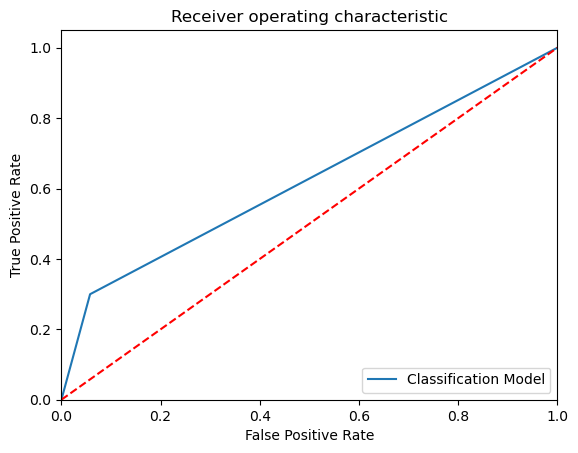

KNN_K_value =  2
Model Name: KNeighborsClassifier(n_neighbors=2)
Confusion matrix : 
 [[  174  1147]
 [  144 13741]]
Outcome values : 
 174 1147 144 13741
Classification report : 
               precision    recall  f1-score   support

           1       0.55      0.13      0.21      1321
           0       0.92      0.99      0.96     13885

    accuracy                           0.92     15206
   macro avg       0.74      0.56      0.58     15206
weighted avg       0.89      0.92      0.89     15206

Accuracy : 91.5 %
Precision : 54.7 %
Recall : 13.2 %
F1 Score : 0.212
Specificity or True Negative Rate : 99.0 %
Balanced Accuracy : 56.1 %
MCC : 0.239
roc_auc_score: 0.561


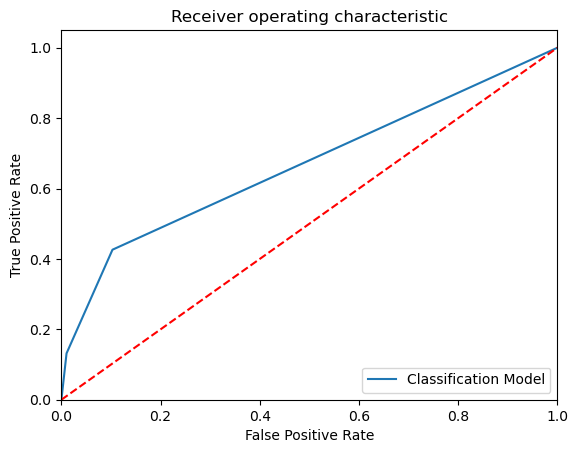

KNN_K_value =  3
Model Name: KNeighborsClassifier(n_neighbors=3)
Confusion matrix : 
 [[  288  1033]
 [  359 13526]]
Outcome values : 
 288 1033 359 13526
Classification report : 
               precision    recall  f1-score   support

           1       0.45      0.22      0.29      1321
           0       0.93      0.97      0.95     13885

    accuracy                           0.91     15206
   macro avg       0.69      0.60      0.62     15206
weighted avg       0.89      0.91      0.89     15206

Accuracy : 90.8 %
Precision : 44.5 %
Recall : 21.8 %
F1 Score : 0.293
Specificity or True Negative Rate : 97.4 %
Balanced Accuracy : 59.6 %
MCC : 0.268
roc_auc_score: 0.596


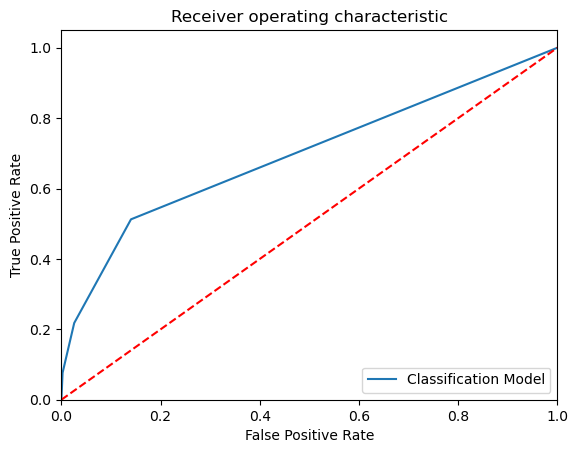

KNN_K_value =  4
Model Name: KNeighborsClassifier(n_neighbors=4)
Confusion matrix : 
 [[  164  1157]
 [  114 13771]]
Outcome values : 
 164 1157 114 13771
Classification report : 
               precision    recall  f1-score   support

           1       0.59      0.12      0.21      1321
           0       0.92      0.99      0.96     13885

    accuracy                           0.92     15206
   macro avg       0.76      0.56      0.58     15206
weighted avg       0.89      0.92      0.89     15206

Accuracy : 91.6 %
Precision : 59.0 %
Recall : 12.4 %
F1 Score : 0.205
Specificity or True Negative Rate : 99.2 %
Balanced Accuracy : 55.8 %
MCC : 0.244
roc_auc_score: 0.558


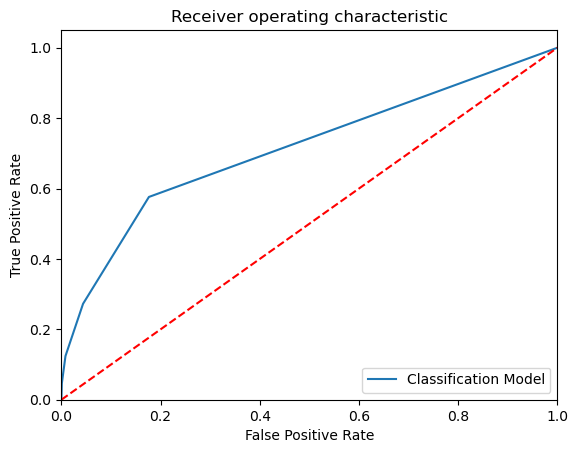

KNN_K_value =  5
Model Name: KNeighborsClassifier()
Confusion matrix : 
 [[  217  1104]
 [  206 13679]]
Outcome values : 
 217 1104 206 13679
Classification report : 
               precision    recall  f1-score   support

           1       0.51      0.16      0.25      1321
           0       0.93      0.99      0.95     13885

    accuracy                           0.91     15206
   macro avg       0.72      0.57      0.60     15206
weighted avg       0.89      0.91      0.89     15206

Accuracy : 91.4 %
Precision : 51.3 %
Recall : 16.4 %
F1 Score : 0.249
Specificity or True Negative Rate : 98.5 %
Balanced Accuracy : 57.4 %
MCC : 0.256
roc_auc_score: 0.575


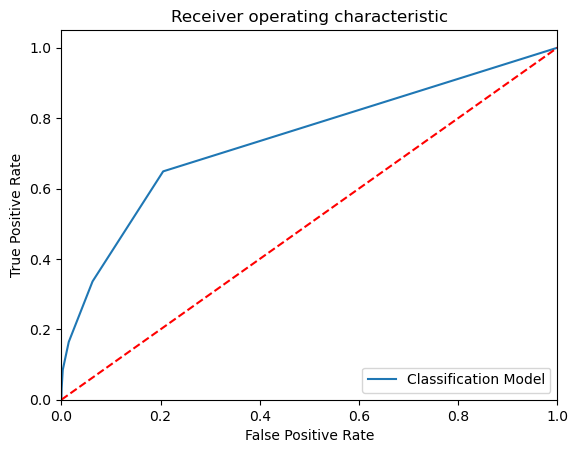

KNN_K_value =  6
Model Name: KNeighborsClassifier(n_neighbors=6)
Confusion matrix : 
 [[  146  1175]
 [   76 13809]]
Outcome values : 
 146 1175 76 13809
Classification report : 
               precision    recall  f1-score   support

           1       0.66      0.11      0.19      1321
           0       0.92      0.99      0.96     13885

    accuracy                           0.92     15206
   macro avg       0.79      0.55      0.57     15206
weighted avg       0.90      0.92      0.89     15206

Accuracy : 91.8 %
Precision : 65.8 %
Recall : 11.1 %
F1 Score : 0.189
Specificity or True Negative Rate : 99.5 %
Balanced Accuracy : 55.3 %
MCC : 0.247
roc_auc_score: 0.553


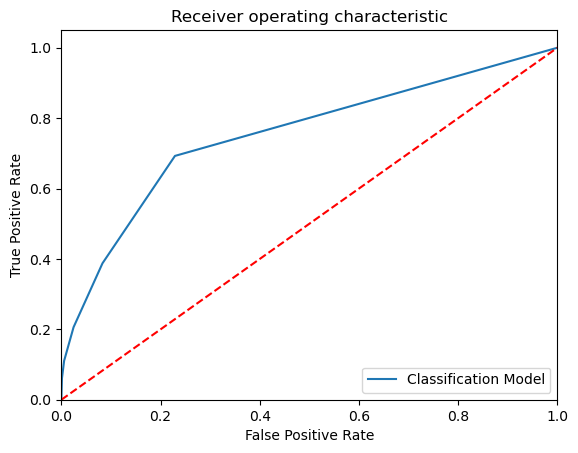

KNN_K_value =  7
Model Name: KNeighborsClassifier(n_neighbors=7)
Confusion matrix : 
 [[  186  1135]
 [  131 13754]]
Outcome values : 
 186 1135 131 13754
Classification report : 
               precision    recall  f1-score   support

           1       0.59      0.14      0.23      1321
           0       0.92      0.99      0.96     13885

    accuracy                           0.92     15206
   macro avg       0.76      0.57      0.59     15206
weighted avg       0.89      0.92      0.89     15206

Accuracy : 91.7 %
Precision : 58.7 %
Recall : 14.1 %
F1 Score : 0.227
Specificity or True Negative Rate : 99.1 %
Balanced Accuracy : 56.6 %
MCC : 0.259
roc_auc_score: 0.566


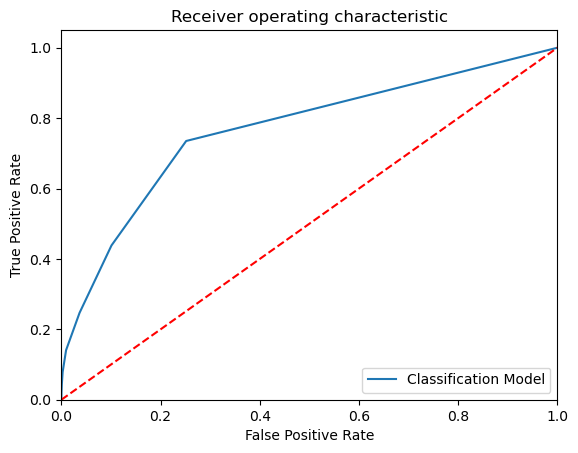

KNN_K_value =  8
Model Name: KNeighborsClassifier(n_neighbors=8)
Confusion matrix : 
 [[  137  1184]
 [   65 13820]]
Outcome values : 
 137 1184 65 13820
Classification report : 
               precision    recall  f1-score   support

           1       0.68      0.10      0.18      1321
           0       0.92      1.00      0.96     13885

    accuracy                           0.92     15206
   macro avg       0.80      0.55      0.57     15206
weighted avg       0.90      0.92      0.89     15206

Accuracy : 91.8 %
Precision : 67.8 %
Recall : 10.4 %
F1 Score : 0.18
Specificity or True Negative Rate : 99.5 %
Balanced Accuracy : 55.0 %
MCC : 0.244
roc_auc_score: 0.55


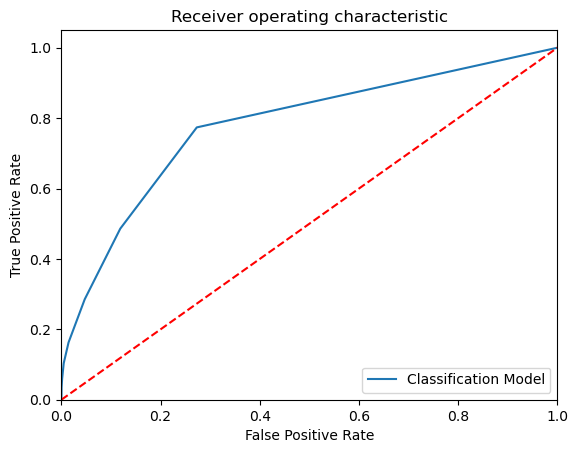

KNN_K_value =  9
Model Name: KNeighborsClassifier(n_neighbors=9)
Confusion matrix : 
 [[  161  1160]
 [   97 13788]]
Outcome values : 
 161 1160 97 13788
Classification report : 
               precision    recall  f1-score   support

           1       0.62      0.12      0.20      1321
           0       0.92      0.99      0.96     13885

    accuracy                           0.92     15206
   macro avg       0.77      0.56      0.58     15206
weighted avg       0.90      0.92      0.89     15206

Accuracy : 91.7 %
Precision : 62.4 %
Recall : 12.2 %
F1 Score : 0.204
Specificity or True Negative Rate : 99.3 %
Balanced Accuracy : 55.8 %
MCC : 0.251
roc_auc_score: 0.557


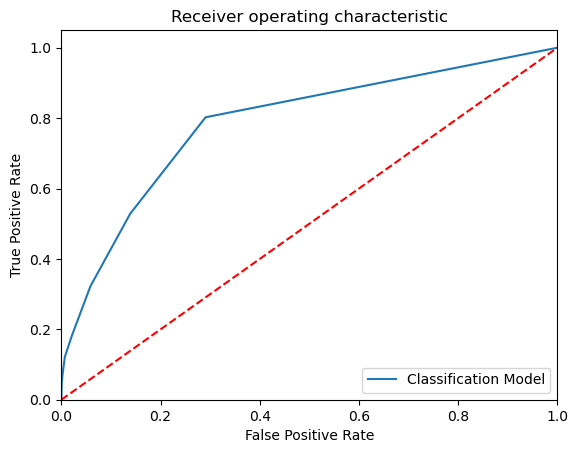

KNN_K_value =  10
Model Name: KNeighborsClassifier(n_neighbors=10)
Confusion matrix : 
 [[  119  1202]
 [   51 13834]]
Outcome values : 
 119 1202 51 13834
Classification report : 
               precision    recall  f1-score   support

           1       0.70      0.09      0.16      1321
           0       0.92      1.00      0.96     13885

    accuracy                           0.92     15206
   macro avg       0.81      0.54      0.56     15206
weighted avg       0.90      0.92      0.89     15206

Accuracy : 91.8 %
Precision : 70.0 %
Recall : 9.0 %
F1 Score : 0.16
Specificity or True Negative Rate : 99.6 %
Balanced Accuracy : 54.3 %
MCC : 0.231
roc_auc_score: 0.543


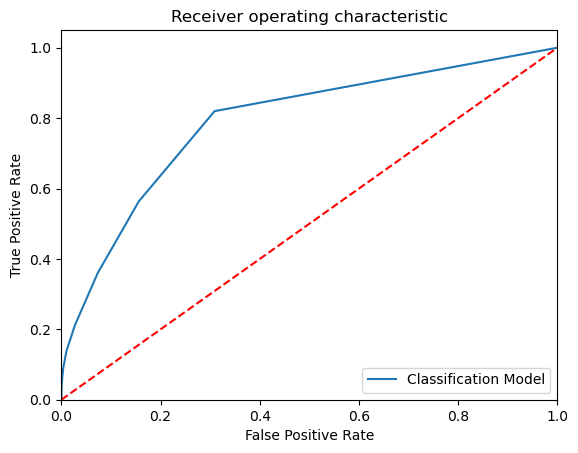

KNN_K_value =  11
Model Name: KNeighborsClassifier(n_neighbors=11)
Confusion matrix : 
 [[  136  1185]
 [   70 13815]]
Outcome values : 
 136 1185 70 13815
Classification report : 
               precision    recall  f1-score   support

           1       0.66      0.10      0.18      1321
           0       0.92      0.99      0.96     13885

    accuracy                           0.92     15206
   macro avg       0.79      0.55      0.57     15206
weighted avg       0.90      0.92      0.89     15206

Accuracy : 91.7 %
Precision : 66.0 %
Recall : 10.3 %
F1 Score : 0.178
Specificity or True Negative Rate : 99.5 %
Balanced Accuracy : 54.9 %
MCC : 0.239
roc_auc_score: 0.549


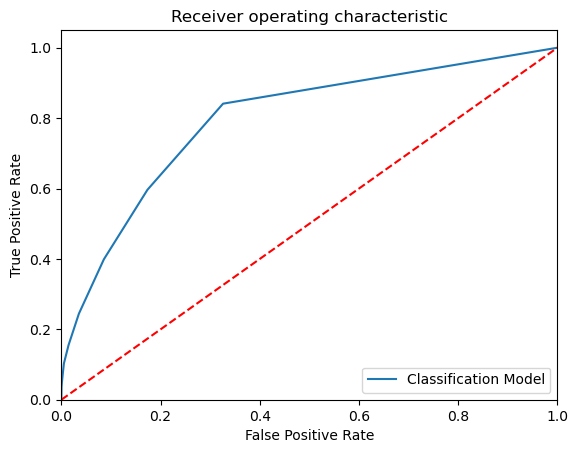

KNN_K_value =  12
Model Name: KNeighborsClassifier(n_neighbors=12)
Confusion matrix : 
 [[  109  1212]
 [   46 13839]]
Outcome values : 
 109 1212 46 13839
Classification report : 
               precision    recall  f1-score   support

           1       0.70      0.08      0.15      1321
           0       0.92      1.00      0.96     13885

    accuracy                           0.92     15206
   macro avg       0.81      0.54      0.55     15206
weighted avg       0.90      0.92      0.89     15206

Accuracy : 91.7 %
Precision : 70.3 %
Recall : 8.3 %
F1 Score : 0.148
Specificity or True Negative Rate : 99.7 %
Balanced Accuracy : 54.0 %
MCC : 0.222
roc_auc_score: 0.54


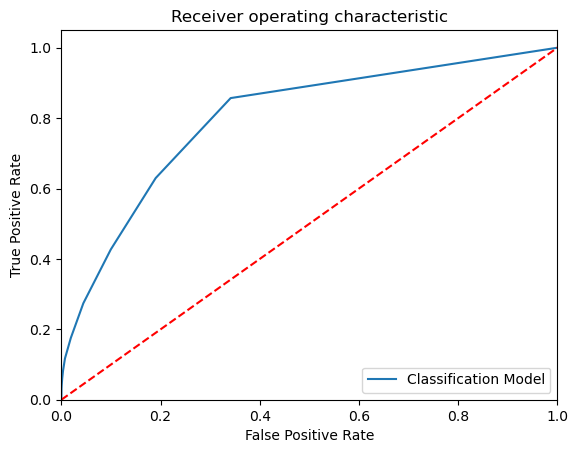

KNN_K_value =  13
Model Name: KNeighborsClassifier(n_neighbors=13)
Confusion matrix : 
 [[  121  1200]
 [   63 13822]]
Outcome values : 
 121 1200 63 13822
Classification report : 
               precision    recall  f1-score   support

           1       0.66      0.09      0.16      1321
           0       0.92      1.00      0.96     13885

    accuracy                           0.92     15206
   macro avg       0.79      0.54      0.56     15206
weighted avg       0.90      0.92      0.89     15206

Accuracy : 91.7 %
Precision : 65.8 %
Recall : 9.2 %
F1 Score : 0.161
Specificity or True Negative Rate : 99.5 %
Balanced Accuracy : 54.4 %
MCC : 0.224
roc_auc_score: 0.544


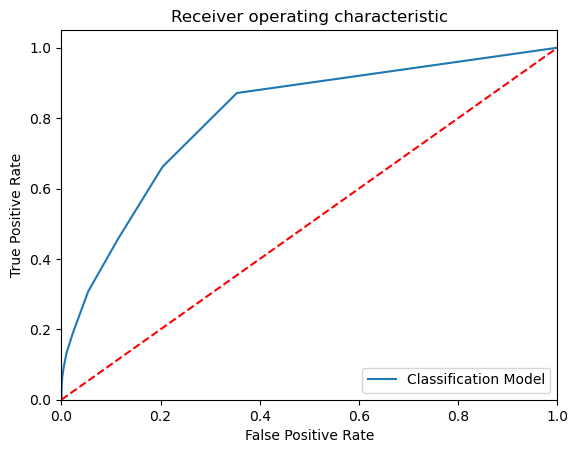

KNN_K_value =  14
Model Name: KNeighborsClassifier(n_neighbors=14)
Confusion matrix : 
 [[  102  1219]
 [   38 13847]]
Outcome values : 
 102 1219 38 13847
Classification report : 
               precision    recall  f1-score   support

           1       0.73      0.08      0.14      1321
           0       0.92      1.00      0.96     13885

    accuracy                           0.92     15206
   macro avg       0.82      0.54      0.55     15206
weighted avg       0.90      0.92      0.89     15206

Accuracy : 91.7 %
Precision : 72.9 %
Recall : 7.7 %
F1 Score : 0.14
Specificity or True Negative Rate : 99.7 %
Balanced Accuracy : 53.7 %
MCC : 0.22
roc_auc_score: 0.537


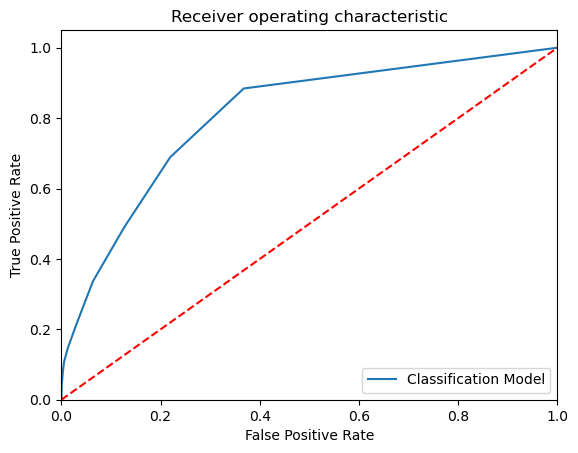

KNN_K_value =  15
Model Name: KNeighborsClassifier(n_neighbors=15)
Confusion matrix : 
 [[  111  1210]
 [   45 13840]]
Outcome values : 
 111 1210 45 13840
Classification report : 
               precision    recall  f1-score   support

           1       0.71      0.08      0.15      1321
           0       0.92      1.00      0.96     13885

    accuracy                           0.92     15206
   macro avg       0.82      0.54      0.55     15206
weighted avg       0.90      0.92      0.89     15206

Accuracy : 91.7 %
Precision : 71.2 %
Recall : 8.4 %
F1 Score : 0.15
Specificity or True Negative Rate : 99.7 %
Balanced Accuracy : 54.0 %
MCC : 0.226
roc_auc_score: 0.54


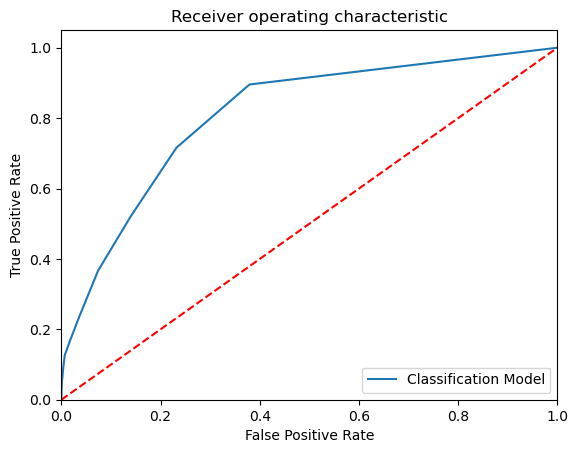

KNN_K_value =  16
Model Name: KNeighborsClassifier(n_neighbors=16)
Confusion matrix : 
 [[   91  1230]
 [   38 13847]]
Outcome values : 
 91 1230 38 13847
Classification report : 
               precision    recall  f1-score   support

           1       0.71      0.07      0.13      1321
           0       0.92      1.00      0.96     13885

    accuracy                           0.92     15206
   macro avg       0.81      0.53      0.54     15206
weighted avg       0.90      0.92      0.88     15206

Accuracy : 91.7 %
Precision : 70.5 %
Recall : 6.9 %
F1 Score : 0.126
Specificity or True Negative Rate : 99.7 %
Balanced Accuracy : 53.3 %
MCC : 0.203
roc_auc_score: 0.533


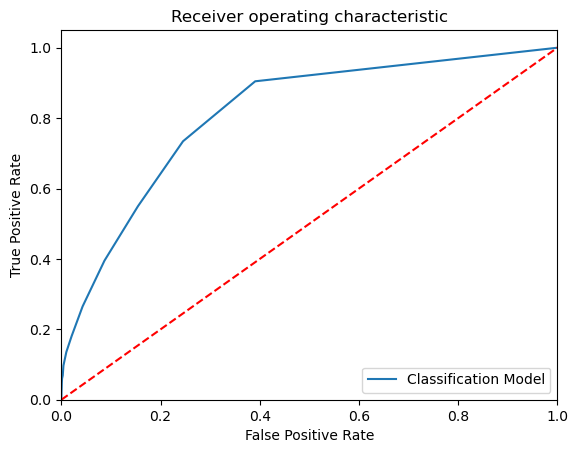

KNN_K_value =  17
Model Name: KNeighborsClassifier(n_neighbors=17)
Confusion matrix : 
 [[  107  1214]
 [   47 13838]]
Outcome values : 
 107 1214 47 13838
Classification report : 
               precision    recall  f1-score   support

           1       0.69      0.08      0.15      1321
           0       0.92      1.00      0.96     13885

    accuracy                           0.92     15206
   macro avg       0.81      0.54      0.55     15206
weighted avg       0.90      0.92      0.89     15206

Accuracy : 91.7 %
Precision : 69.5 %
Recall : 8.1 %
F1 Score : 0.145
Specificity or True Negative Rate : 99.7 %
Balanced Accuracy : 53.9 %
MCC : 0.218
roc_auc_score: 0.539


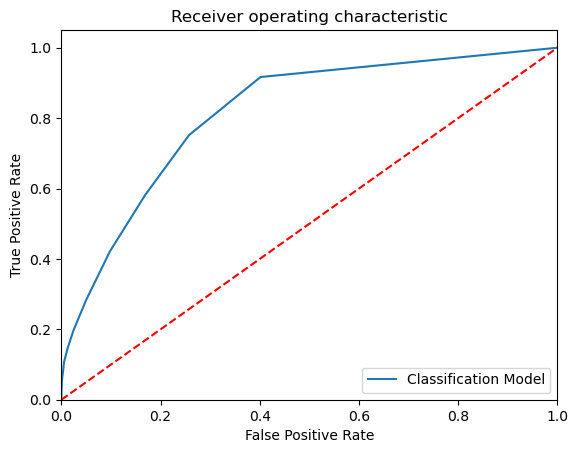

KNN_K_value =  18
Model Name: KNeighborsClassifier(n_neighbors=18)
Confusion matrix : 
 [[   93  1228]
 [   34 13851]]
Outcome values : 
 93 1228 34 13851
Classification report : 
               precision    recall  f1-score   support

           1       0.73      0.07      0.13      1321
           0       0.92      1.00      0.96     13885

    accuracy                           0.92     15206
   macro avg       0.83      0.53      0.54     15206
weighted avg       0.90      0.92      0.88     15206

Accuracy : 91.7 %
Precision : 73.2 %
Recall : 7.0 %
F1 Score : 0.128
Specificity or True Negative Rate : 99.8 %
Balanced Accuracy : 53.4 %
MCC : 0.21
roc_auc_score: 0.534


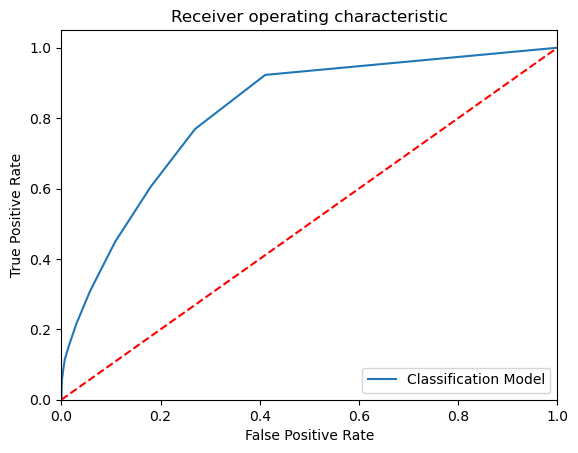

KNN_K_value =  19
Model Name: KNeighborsClassifier(n_neighbors=19)
Confusion matrix : 
 [[  100  1221]
 [   38 13847]]
Outcome values : 
 100 1221 38 13847
Classification report : 
               precision    recall  f1-score   support

           1       0.72      0.08      0.14      1321
           0       0.92      1.00      0.96     13885

    accuracy                           0.92     15206
   macro avg       0.82      0.54      0.55     15206
weighted avg       0.90      0.92      0.89     15206

Accuracy : 91.7 %
Precision : 72.5 %
Recall : 7.6 %
F1 Score : 0.137
Specificity or True Negative Rate : 99.7 %
Balanced Accuracy : 53.6 %
MCC : 0.217
roc_auc_score: 0.536


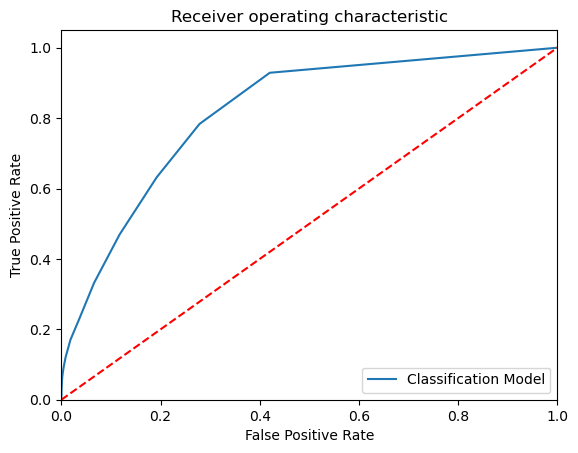

KNN_K_value =  20
Model Name: KNeighborsClassifier(n_neighbors=20)
Confusion matrix : 
 [[   93  1228]
 [   29 13856]]
Outcome values : 
 93 1228 29 13856
Classification report : 
               precision    recall  f1-score   support

           1       0.76      0.07      0.13      1321
           0       0.92      1.00      0.96     13885

    accuracy                           0.92     15206
   macro avg       0.84      0.53      0.54     15206
weighted avg       0.91      0.92      0.88     15206

Accuracy : 91.7 %
Precision : 76.2 %
Recall : 7.0 %
F1 Score : 0.129
Specificity or True Negative Rate : 99.8 %
Balanced Accuracy : 53.4 %
MCC : 0.216
roc_auc_score: 0.534


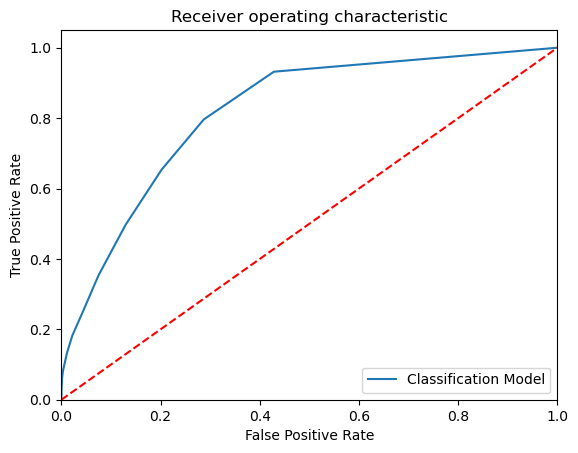

In [32]:

# Bild KNN Model

from sklearn.neighbors import KNeighborsClassifier

from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

import sklearn.metrics as metrics

from sklearn.metrics import roc_curve, roc_auc_score

accuracy = []

for a in range(1, 21, 1):
    
    k = a
    
    # Build the model
    
    ModelKNN = KNeighborsClassifier(n_neighbors=k)
    
    # Train the model
    
    ModelKNN.fit(x_train,y_train)
    
    # Predict the model
    
    y_pred = ModelKNN.predict(x_test)
    y_pred_prob = ModelKNN.predict_proba(x_test)
    
    print('KNN_K_value = ', a)
    
    # Print the model name
    
    print('Model Name:',ModelKNN )
    
    # confusion matrix in sklearn
    
    from sklearn.metrics import confusion_matrix
    from sklearn.metrics import classification_report
    
    # actual values
    
    actual = y_test
    
    # predicted values
    
    predicted = y_pred
    
    # confusion matrix
    
    matrix = confusion_matrix(actual,predicted, labels=[1,0],sample_weight=None, normalize=None)
    print('Confusion matrix : \n', matrix)
    
    # outcome values order in sklearn
    
    tp, fn, fp, tn = confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
    print('Outcome values : \n', tp, fn, fp, tn)
    
    # classification report for precision, recall f1-score and accuracy
    
    C_Report = classification_report(actual,predicted,labels=[1,0])
    
    print('Classification report : \n', C_Report)
    
    # calculating the metrics
    
    sensitivity = round(tp/(tp+fn), 3);
    specificity = round(tn/(tn+fp), 3);
    accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
    balanced_accuracy = round((sensitivity+specificity)/2, 3);
    
    precision = round(tp/(tp+fp), 3);
    f1Score = round((2*tp/(2*tp + fp + fn)), 3);
    
    # Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1. 
    # A model with a score of +1 is a perfect model and -1 is a poor model
    
    from math import sqrt
    
    mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
    MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)
    
    print('Accuracy :', round(accuracy*100, 2),'%')
    print('Precision :', round(precision*100, 2),'%')
    print('Recall :', round(sensitivity*100,2), '%')
    print('F1 Score :', f1Score)
    print('Specificity or True Negative Rate :', round(specificity*100,2), '%'  )
    print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
    print('MCC :', MCC)
    
    # Area under ROC curve 
    
    from sklearn.metrics import roc_curve, roc_auc_score
    
    print('roc_auc_score:', round(roc_auc_score(actual, predicted), 3))
    
    # ROC Curve
    
    from sklearn.metrics import roc_auc_score
    from sklearn.metrics import roc_curve
    model_roc_auc = roc_auc_score(actual, predicted)
    fpr, tpr, thresholds = roc_curve(actual, ModelKNN.predict_proba(x_test)[:,1])
    plt.figure()
    # plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
    plt.plot(fpr, tpr, label= 'Classification Model' % model_roc_auc)
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic')
    plt.legend(loc="lower right")
    #plt.savefig('Log_ROC')
    plt.show()
    #------------------------------------------------------------------------------
    new_row = {'Model Name' : ModelKNN,
               'KNN K Value' : a,
               'True_Positive' : tp,
               'False_Negative' : fn,
               'False_Positive' : fp,
               'True_Negative' : tn,
               'Accuracy' : accuracy,
               'Precision' : precision,
               'Recall' : sensitivity,
               'F1 Score' : f1Score,
               'Specificity' : specificity,
               'MCC':MCC,
               'ROC_AUC_Score':roc_auc_score(actual, predicted),
               'Balanced Accuracy':balanced_accuracy}
    KNN_Results = KNN_Results.append(new_row, ignore_index=True)
    #------KNN_Results------------------------------------------------------------------------


In [33]:
#displaying the KNNresults data

KNN_Results

,Model Name,KNN K Value,True_Positive,False_Negative,False_Positive,True_Negative,Accuracy,Precision,Recall,F1 Score,Specificity,MCC,ROC_AUC_Score,Balanced Accuracy
0,KNeighborsClassifier(n_neighbors=1),1,396,925,803,13082,0.886,0.330,0.300,0.314,0.942,0.253,0.620970,0.621
1,KNeighborsClassifier(n_neighbors=2),2,174,1147,144,13741,0.915,0.547,0.132,0.212,0.990,0.239,0.560674,0.561
2,KNeighborsClassifier(n_neighbors=3),3,288,1033,359,13526,0.908,0.445,0.218,0.293,0.974,0.268,0.596081,0.596
3,KNeighborsClassifier(n_neighbors=4),4,164,1157,114,13771,0.916,0.590,0.124,0.205,0.992,0.244,0.557969,0.558
4,KNeighborsClassifier(),5,217,1104,206,13679,0.914,0.513,0.164,0.249,0.985,0.256,0.574717,0.574
5,KNeighborsClassifier(n_neighbors=6),6,146,1175,76,13809,0.918,0.658,0.111,0.189,0.995,0.247,0.552524,0.553
6,KNeighborsClassifier(n_neighbors=7),7,186,1135,131,13754,0.917,0.587,0.141,0.227,0.991,0.259,0.565684,0.566
7,KNeighborsClassifier(n_neighbors=8),8,137,1184,65,13820,0.918,0.678,0.104,0.180,0.995,0.244,0.549514,0.550
8,KNeighborsClassifier(n_neighbors=9),9,161,1160,97,13788,0.917,0.624,0.122,0.204,0.993,0.251,0.557446,0.558
9,KNeighborsClassifier(n_neighbors=10),10,119,1202,51,13834,0.918,0.700,0.090,0.160,0.996,0.231,0.543205,0.543


In [34]:
#reading the required csv file

EMResults=pd.read_csv(r"C:\Users\Dlc\Downloads\Dataset and Results File\EMResults.csv",header=0)


Model Name:  LogisticRegression()
Confusion matrix : 
 [[   78  1243]
 [   42 13843]]
Outcome values : 
 78 1243 42 13843
Classification report : 
               precision    recall  f1-score   support

           1       0.65      0.06      0.11      1321
           0       0.92      1.00      0.96     13885

    accuracy                           0.92     15206
   macro avg       0.78      0.53      0.53     15206
weighted avg       0.89      0.92      0.88     15206

Accuracy : 91.5 %
Precision : 65.0 %
Recall : 5.9 %
F1 Score : 0.108
Specificity or True Negative Rate : 99.7 %
Balanced Accuracy : 52.8 %
MCC : 0.178
roc_auc_score: 0.528


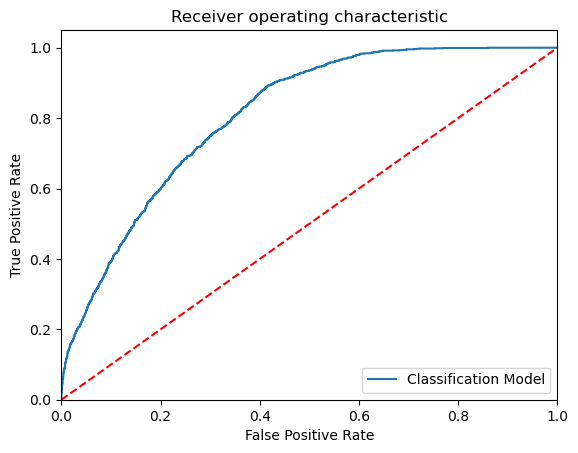

-----------------------------------------------------------------------------------------------------
Model Name:  DecisionTreeClassifier()
Confusion matrix : 
 [[  576   745]
 [  943 12942]]
Outcome values : 
 576 745 943 12942
Classification report : 
               precision    recall  f1-score   support

           1       0.38      0.44      0.41      1321
           0       0.95      0.93      0.94     13885

    accuracy                           0.89     15206
   macro avg       0.66      0.68      0.67     15206
weighted avg       0.90      0.89      0.89     15206

Accuracy : 88.9 %
Precision : 37.9 %
Recall : 43.6 %
F1 Score : 0.406
Specificity or True Negative Rate : 93.2 %
Balanced Accuracy : 68.4 %
MCC : 0.346
roc_auc_score: 0.684


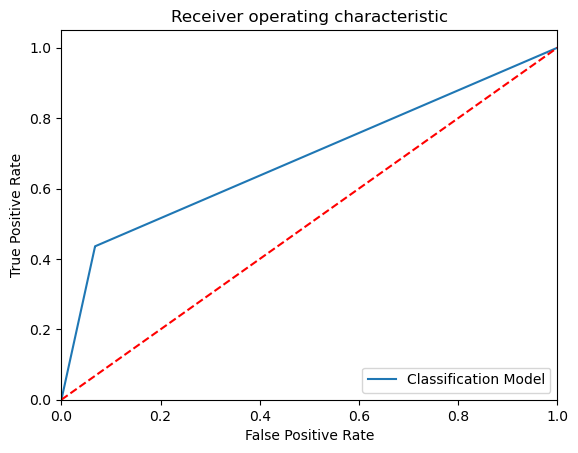

-----------------------------------------------------------------------------------------------------
Model Name:  RandomForestClassifier()
Confusion matrix : 
 [[  340   981]
 [   79 13806]]
Outcome values : 
 340 981 79 13806
Classification report : 
               precision    recall  f1-score   support

           1       0.81      0.26      0.39      1321
           0       0.93      0.99      0.96     13885

    accuracy                           0.93     15206
   macro avg       0.87      0.63      0.68     15206
weighted avg       0.92      0.93      0.91     15206

Accuracy : 93.0 %
Precision : 81.1 %
Recall : 25.7 %
F1 Score : 0.391
Specificity or True Negative Rate : 99.4 %
Balanced Accuracy : 62.6 %
MCC : 0.433
roc_auc_score: 0.626


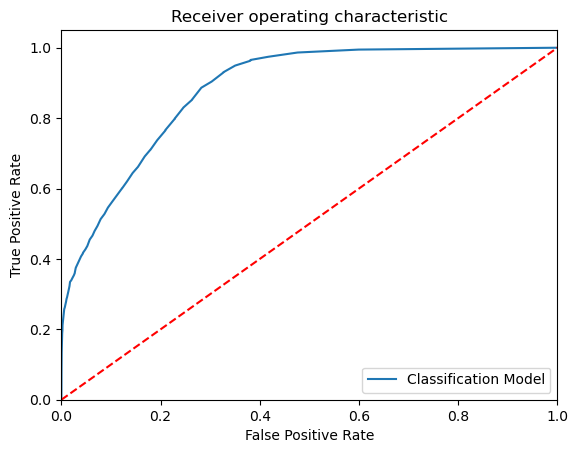

-----------------------------------------------------------------------------------------------------
Model Name:  ExtraTreesClassifier()
Confusion matrix : 
 [[  342   979]
 [  131 13754]]
Outcome values : 
 342 979 131 13754
Classification report : 
               precision    recall  f1-score   support

           1       0.72      0.26      0.38      1321
           0       0.93      0.99      0.96     13885

    accuracy                           0.93     15206
   macro avg       0.83      0.62      0.67     15206
weighted avg       0.92      0.93      0.91     15206

Accuracy : 92.7 %
Precision : 72.3 %
Recall : 25.9 %
F1 Score : 0.381
Specificity or True Negative Rate : 99.1 %
Balanced Accuracy : 62.5 %
MCC : 0.405
roc_auc_score: 0.625


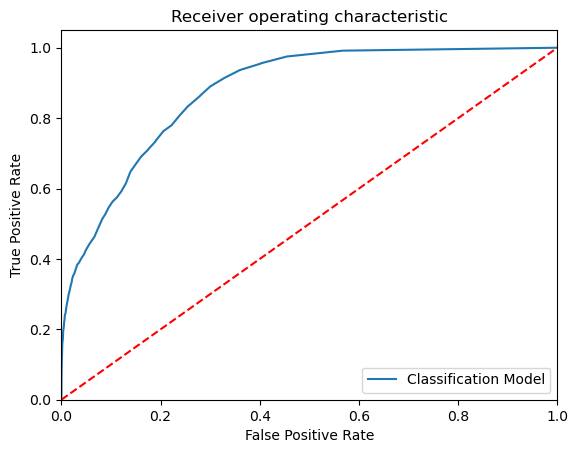

-----------------------------------------------------------------------------------------------------
Model Name:  KNeighborsClassifier(n_neighbors=6)
Confusion matrix : 
 [[  146  1175]
 [   76 13809]]
Outcome values : 
 146 1175 76 13809
Classification report : 
               precision    recall  f1-score   support

           1       0.66      0.11      0.19      1321
           0       0.92      0.99      0.96     13885

    accuracy                           0.92     15206
   macro avg       0.79      0.55      0.57     15206
weighted avg       0.90      0.92      0.89     15206

Accuracy : 91.8 %
Precision : 65.8 %
Recall : 11.1 %
F1 Score : 0.189
Specificity or True Negative Rate : 99.5 %
Balanced Accuracy : 55.3 %
MCC : 0.247
roc_auc_score: 0.553


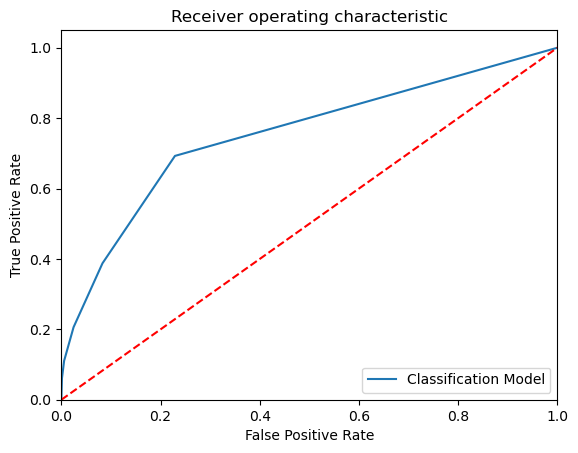

-----------------------------------------------------------------------------------------------------
Model Name:  SVC(class_weight='balanced', probability=True, random_state=42)
Confusion matrix : 
 [[1146  175]
 [4740 9145]]
Outcome values : 
 1146 175 4740 9145
Classification report : 
               precision    recall  f1-score   support

           1       0.19      0.87      0.32      1321
           0       0.98      0.66      0.79     13885

    accuracy                           0.68     15206
   macro avg       0.59      0.76      0.55     15206
weighted avg       0.91      0.68      0.75     15206

Accuracy : 67.7 %
Precision : 19.5 %
Recall : 86.8 %
F1 Score : 0.318
Specificity or True Negative Rate : 65.9 %
Balanced Accuracy : 76.4 %
MCC : 0.304
roc_auc_score: 0.763


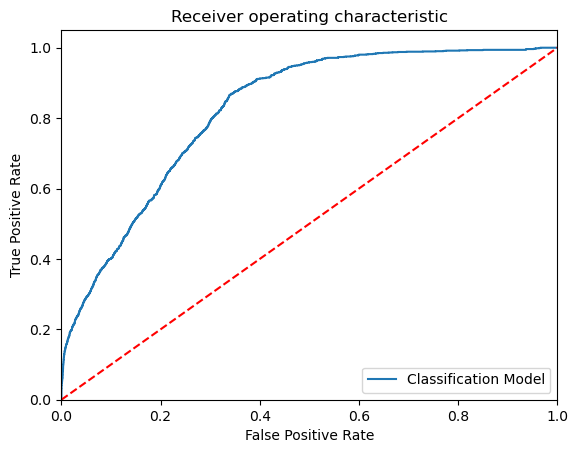

-----------------------------------------------------------------------------------------------------
Model Name:  GaussianNB()
Confusion matrix : 
 [[  151  1170]
 [  186 13699]]
Outcome values : 
 151 1170 186 13699
Classification report : 
               precision    recall  f1-score   support

           1       0.45      0.11      0.18      1321
           0       0.92      0.99      0.95     13885

    accuracy                           0.91     15206
   macro avg       0.68      0.55      0.57     15206
weighted avg       0.88      0.91      0.89     15206

Accuracy : 91.1 %
Precision : 44.8 %
Recall : 11.4 %
F1 Score : 0.182
Specificity or True Negative Rate : 98.7 %
Balanced Accuracy : 55.0 %
MCC : 0.193
roc_auc_score: 0.55


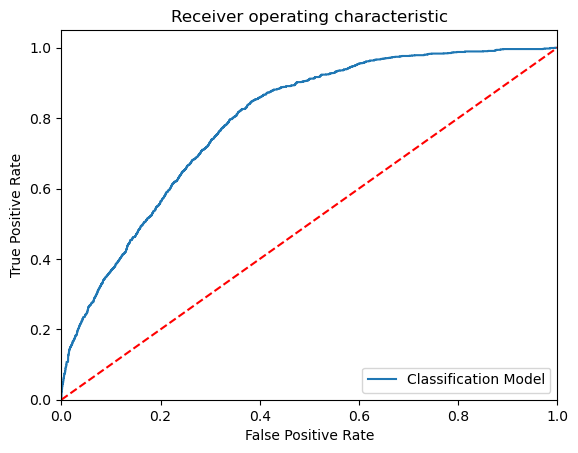

-----------------------------------------------------------------------------------------------------


In [35]:

# Build the Calssification models and compare the results

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB

# Create objects of classification algorithm with default hyper-parameters

ModelLR = LogisticRegression()
ModelDC = DecisionTreeClassifier()
ModelRF = RandomForestClassifier()
ModelET = ExtraTreesClassifier()
ModelKNN = KNeighborsClassifier(n_neighbors=6)
ModelSVM = SVC(kernel='rbf', random_state = 42, class_weight='balanced', probability=True)
ModelGNB = GaussianNB()

# Evalution matrix for all the algorithms

MM = [ModelLR, ModelDC, ModelRF, ModelET, ModelKNN, ModelSVM, ModelGNB]
for models in MM:
    
    # Fit the model
    
    models.fit(x_train, y_train)
    
    # Prediction
    
    y_pred = models.predict(x_test)
    y_pred_prob = models.predict_proba(x_test)
    
    # Print the model name
    
    print('Model Name: ', models)
    
    # confusion matrix in sklearn

    from sklearn.metrics import confusion_matrix
    from sklearn.metrics import classification_report

    # actual values

    actual = y_test

    # predicted values

    predicted = y_pred

    # confusion matrix

    matrix = confusion_matrix(actual,predicted, labels=[1,0],sample_weight=None, normalize=None)
    print('Confusion matrix : \n', matrix)

    # outcome values order in sklearn

    tp, fn, fp, tn = confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
    print('Outcome values : \n', tp, fn, fp, tn)

    # classification report for precision, recall f1-score and accuracy

    C_Report = classification_report(actual,predicted,labels=[1,0])

    print('Classification report : \n', C_Report)

    # calculating the metrics

    sensitivity = round(tp/(tp+fn), 3);
    specificity = round(tn/(tn+fp), 3);
    accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
    balanced_accuracy = round((sensitivity+specificity)/2, 3);
    
    precision = round(tp/(tp+fp), 3);
    f1Score = round((2*tp/(2*tp + fp + fn)), 3);

    # Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1. 
    # A model with a score of +1 is a perfect model and -1 is a poor model

    from math import sqrt

    mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
    MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)

    print('Accuracy :', round(accuracy*100, 2),'%')
    print('Precision :', round(precision*100, 2),'%')
    print('Recall :', round(sensitivity*100,2), '%')
    print('F1 Score :', f1Score)
    print('Specificity or True Negative Rate :', round(specificity*100,2), '%'  )
    print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
    print('MCC :', MCC)

    # Area under ROC curve 

    from sklearn.metrics import roc_curve, roc_auc_score

    print('roc_auc_score:', round(roc_auc_score(actual, predicted), 3))
    
    # ROC Curve
    
    from sklearn.metrics import roc_auc_score
    from sklearn.metrics import roc_curve
    logit_roc_auc = roc_auc_score(actual, predicted)
    fpr, tpr, thresholds = roc_curve(actual, models.predict_proba(x_test)[:,1])
    plt.figure()
    # plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
    plt.plot(fpr, tpr, label= 'Classification Model' % logit_roc_auc)
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic')
    plt.legend(loc="lower right")
    plt.savefig('Log_ROC')
    plt.show()
    print('-----------------------------------------------------------------------------------------------------')
    #----------------------------------------------------------------------------------------------------------
    new_row = {'Model Name' : models,
               'True_Positive' : tp, 
               'False_Negative' : fn, 
               'False_Positive' : fp,
               'True_Negative' : tn,
               'Accuracy' : accuracy,
               'Precision' : precision,
               'Recall' : sensitivity,
               'F1 Score' : f1Score,
               'Specificity' : specificity,
               'MCC':MCC,
               'ROC_AUC_Score':roc_auc_score(actual, predicted),
               'Balanced Accuracy':balanced_accuracy}
    EMResults = EMResults.append(new_row, ignore_index=True)
    #----------------------------------------------------------------------------------------------------------

In [36]:
#displaying the EMresults data

EMResults

,Model Name,True_Positive,False_Negative,False_Positive,True_Negative,Accuracy,Precision,Recall,F1 Score,Specificity,MCC,ROC_AUC_Score,Balanced Accuracy
0,LogisticRegression(),78,1243,42,13843,0.915,0.650,0.059,0.108,0.997,0.178,0.528011,0.528
1,DecisionTreeClassifier(),576,745,943,12942,0.889,0.379,0.436,0.406,0.932,0.346,0.684059,0.684
2,"(DecisionTreeClassifier(max_features='sqrt', r...",340,981,79,13806,0.930,0.811,0.257,0.391,0.994,0.433,0.625846,0.626
3,"(ExtraTreeClassifier(random_state=1298772446),...",342,979,131,13754,0.927,0.723,0.259,0.381,0.991,0.405,0.624730,0.625
4,KNeighborsClassifier(n_neighbors=6),146,1175,76,13809,0.918,0.658,0.111,0.189,0.995,0.247,0.552524,0.553
5,"SVC(class_weight='balanced', probability=True,...",1146,175,4740,9145,0.677,0.195,0.868,0.318,0.659,0.304,0.763075,0.764
6,GaussianNB(),151,1170,186,13699,0.911,0.448,0.114,0.182,0.987,0.193,0.550456,0.550


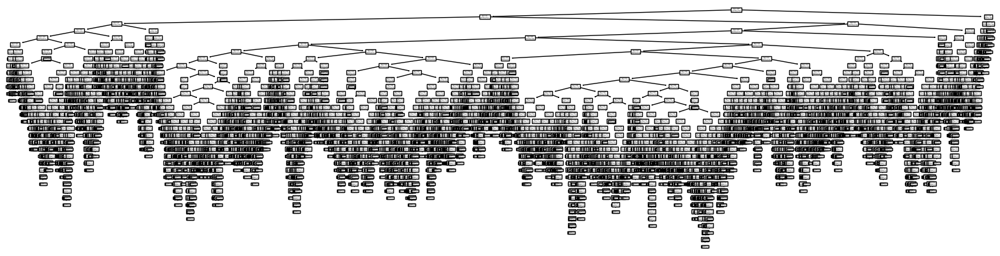

In [37]:
import matplotlib.pyplot as plt
from sklearn import tree
plt.figure(figsize=(20,5))
tree.plot_tree(ModelDC);

In [38]:
# Create a list for plotting the decision trees

figcols = ['employee_id', 'department', 'region', 'education', 'gender',
       'recruitment_channel', 'no_of_trainings', 'age', 'previous_year_rating',
       'length_of_service', 'KPIs_met >80%', 'awards_won?',
       'avg_training_score', 'is_promoted']


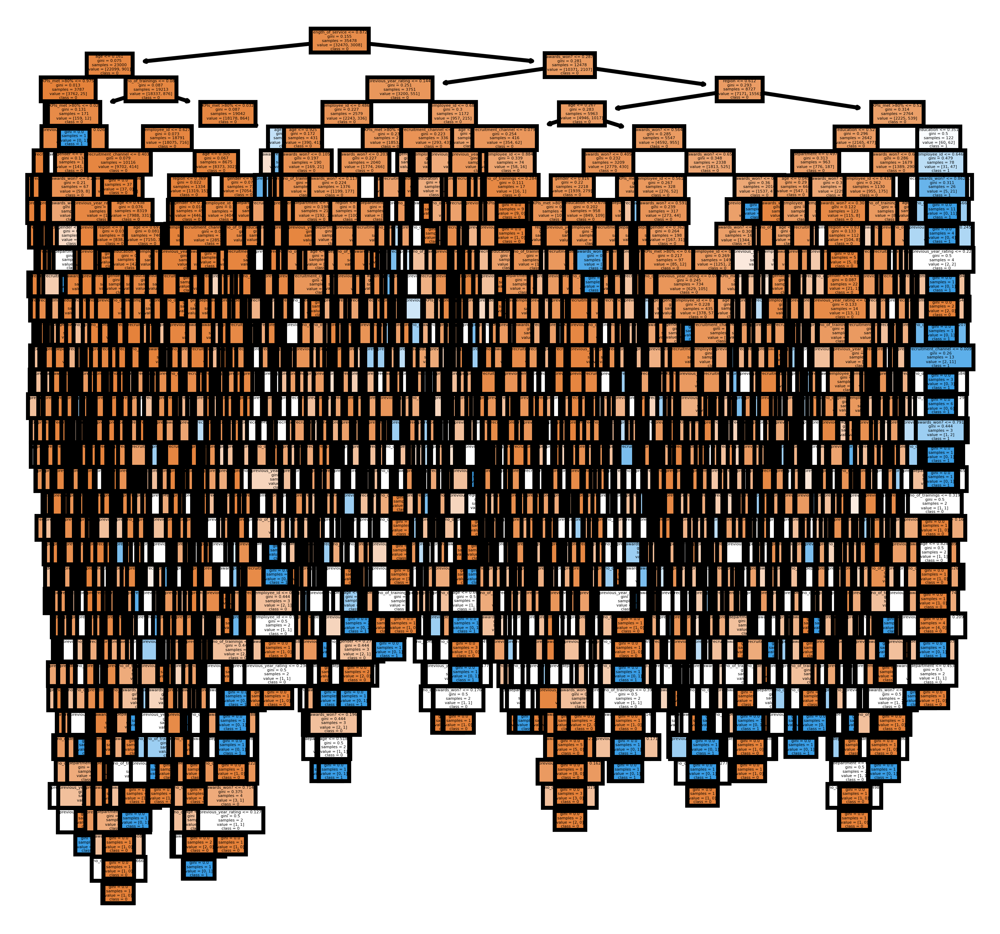

In [39]:
# Visualize individual trees and code below visualizes the first decision tree of Extra Trees Classifier

from sklearn import tree

fn1=figcols
cn1=['0', '1']

fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize = (4,4), dpi=800)
tree.plot_tree(ModelET.estimators_[0],
               feature_names = fn1, 
               class_names=cn1,
               filled = True);
#fig.savefig('ModelET.png')


In [40]:
# Visualize individual trees and code below visualizes the first 5 decision trees of Extra Trees Classifier

from sklearn import tree

fn2=figcols
cn2=['0', '1']

fig, axes = plt.subplots(nrows = 1, ncols = 5, figsize = (10,2), dpi=3000)
for index in range(0, 5):
    tree.plot_tree(ModelET.estimators_[index],
                   feature_names = fn2, 
                   class_names=cn2,
                   filled = True,
                   ax = axes[index]);
    
    axes[index].set_title('Estimator: ' + str(index), fontsize = 11)
#fig.savefig('ModelET1.png')


In [41]:
# Predict the values KNN algorithm

y_predDC = ModelDC.predict(x_test)

In [42]:
Results = pd.DataFrame({'is_promoted_A':y_test, 'is_promoted_P':y_predDC})

# Merge two Dataframes on index of both the dataframes

ResultsFinal = Hdata.merge(Results, left_index=True, right_index=True)
ResultsFinal.sample(10)

,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted,is_promoted_A,is_promoted_P
37594,4,6,2,1,1,1,40,5.0,6,0,0,59,0,0,0
32128,8,13,1,1,2,1,27,3.0,5,0,0,80,0,0,0
53237,4,18,2,1,0,1,39,4.0,5,0,0,60,0,0,0
6771,5,11,0,0,0,1,31,4.0,4,1,0,69,0,0,0
32827,7,7,0,1,2,1,35,5.0,7,1,0,51,0,0,0
1546,5,21,0,1,2,1,31,1.0,3,0,0,70,0,0,0
18720,4,19,0,0,2,1,36,4.0,10,0,0,57,0,0,0
16110,5,11,2,1,2,1,30,3.0,4,0,0,69,0,0,0
45720,8,14,0,0,2,1,26,5.0,3,0,0,83,0,0,1
31257,0,31,2,1,0,2,51,1.0,16,0,0,82,0,0,0
